# Оптимизация процесса обработки стали

## Описание проекта

### Цель проекта

Для оптимизации производственных расходов необходимо уменьшить потребление электроэнергии на этапе обработки стали, для этого нужно построить модель, которая предскажет температуру стали.

### Описание этапа обработки стали

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша.

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. slab, «плита»).

## План работы

Для выполнения проекта, необходимо провести первоначальный анализ имеющихся данных, чтобы составить полное представление о имеющихся данных и о плане выполнения последующей работы.
При анализе имеющихся датасетов необходимо проанализировать выбросы, отсутствующие значения и распределение имеющихся, определить важность каждого из параметров, определить целевое значение.

После исследовательского анализа данных создадим из исходных новый датасет с необходимыми для обучения и прогнозирования модели признаками.

Изучим работу трех различных моделей машинного обучения: линейную регрессию, случайный лес и градиентный бустинг.
Метрикой качества в нашем случае будет являться MAE. Максимально допустимое значение MAE: 6.8.
Оптимальные параметры для последних двух определим с помощью RandomizedSearchCV. Проверка модели линейной регрессии  будет определяться методом кросс-валидации.

Наилучшую модель проверим на тестовой выборке.

План работы в таком случае будет выглядть следующим образом:
1. **Подготовка данных**
Временные характеристики не представляется возможным использовать. Можно преобразовать их в качестве количества случаев нагрева и среднего/медианного значения времени и мощности нагрева. Промежуточные значения температур в таком случае так же не представляется возможным использовать. Перед обучением необходимо провести проверку имеющихся данных на их корелляцию между собой.
2. **Выбор и обучение модели**
Планируется рассмотреть различные варианты моделей. Основной упор предпочтительней сделать на модели деревьев, особенно на решающий леси модели градиентного бустинга.
3. **Валидация модели**
Выбрать наилучшую модель на тестовой выборке, после чего оценить модель на тестовой выборке.
4. **Отчет**
Провести анализ проделанной работы, оценить использованные факторы на важность.

## Исследовательский анализ данных

### Описание исходных данных

В качестве исходных данных имеется следующая информация:
- `data_arc_new.csv` — данные об электродах;
- `data_bulk_new.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time_new.csv` — данные о подаче сыпучих материалов (время);
- `data_gas_new.csv` — данные о продувке сплава газом;
- `data_temp_new.csv` — результаты измерения температуры;
- `data_wire_new.csv` — данные о проволочных материалах (объём);
- `data_wire_time_new.csv` — данные о проволочных материалах (время).

Во всех файлах столбец key содержит номер партии. В случае нескольких строк с одинаковым значением key - они соответствуют разным итерациям обработки.

In [1]:
!pip install -q catboost
!pip install -q shap

In [2]:
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

from catboost import CatBoostRegressor

import shap

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
RANDOM_STATE = 161023

Загрузим все имеющиеся датасеты для дальнейшего анализа.

In [5]:
def load_data(path):
    try:
        initial_data = pd.read_csv('initial_data/' + path)
    except:
        initial_data = pd.read_csv('/datasets/' + path)
    return initial_data

In [6]:
data_arc_new = load_data('data_arc_new.csv')
data_bulk_new = load_data('data_bulk_new.csv')
data_bulk_time_new = load_data('data_bulk_time_new.csv')
data_gas_new = load_data('data_gas_new.csv')
data_temp_new = load_data('data_temp_new.csv')
data_wire_new = load_data('data_wire_new.csv')
data_wire_time_new = load_data('data_wire_time_new.csv')

Исследуем каждый из представленных датасетов.

#### Данные об электродах

In [7]:
data_arc_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


Для дальнейше работы с датасетом, переименуем признаки.

In [8]:
data_arc_new = data_arc_new.rename(columns={
    'Начало нагрева дугой': 'start_time', 
    'Конец нагрева дугой': 'end_time', 
    'Активная мощность' : 'power_active',
    'Реактивная мощность' : 'power_reactive',
})

И приведем время к формату дат.

In [9]:
data_arc_new[['start_time', 'end_time']] = \
data_arc_new[['start_time', 'end_time']].apply(pd.to_datetime, format='%Y-%m-%d %H:%M:%S')

In [10]:
data_arc_new.head(10)

,key,start_time,end_time,power_active,power_reactive
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.381124,0.220351
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,0.261665,0.205527
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.710297,0.484962
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.786322,0.542517
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.101678,0.820856


Из первых 10 строк можно понять структуру представленного датасета: имеется номер партии, и время начала и окончания нагрева, а так же активная мощность, затраченная на нагрев, и реактивная, потерянная из-за переменного тока.

In [11]:
data_arc_new.drop('key', axis=1).describe()

,power_active,power_reactive
count,14876.000000,14876.000000
mean,0.662752,0.438986
std,0.258885,5.873485
min,0.223120,-715.479924
25%,0.467115,0.337175
50%,0.599587,0.441639
75%,0.830070,0.608201
max,1.463773,1.270284


Из полученной информации видно, что в датасете присутствует описание 3241 партии стали, при этом в каждой партии количество нагревов различается. Возможно, при разработке модели будет необходимо рассчитать продолжительность каждого нагрева вместо начала и окончания нагрева, а так же количество включений нагревателя.
Распределение значений активной мощности не выглядит аномальным, в отличие от реактивной мощности, где присутствует выброс со значением -715, что в сотни раз отличается от остальных значений.  

Построим диаграммы размаха для значений мощностей, но ограничим их нулевым значением. Для активной мощности это не повлияет на результат, а для реактивной - позволит рассмотреть диаграмму размаха без влияния аномально низкого значения.

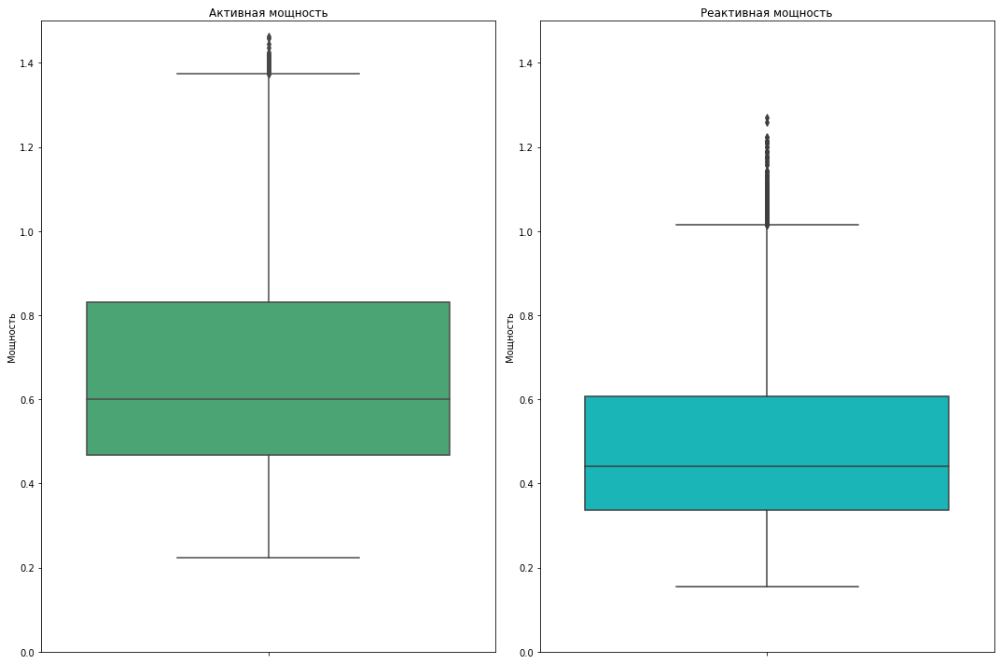

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(1, 2, figsize=(15, 10))

sns.boxplot(data=data_arc_new, y='power_active', color='mediumseagreen', ax=axs[0], orient='v')
axs[0].set_title('Активная мощность')
axs[0].set_ylabel('Мощность')
axs[0].set_ylim(0, 1.5)

sns.boxplot(data=data_arc_new, y='power_reactive', color='darkturquoise', ax=axs[1], orient='v')
axs[1].set_title('Реактивная мощность')
axs[1].set_ylabel('Мощность')
axs[1].set_ylim(0, 1.5)

plt.tight_layout()
plt.show()

Рассмотрим полученные диаграммы:
1. **Активная мощность**
Как видно из диаграммы, имеется небольшое количество выбросов выше максимального значения, но в пределах десятых долей единицы. Медианное значение равно 0.6, оно сдвинуто ближе к первому квартилю.
2. **Реактивная мощность**
Картина схожа с реактивным значением: медианное значение находится ближу к первому квартилю, есть выбросы выше примерно 1.05. Кроме того, все значения (квартили, медиана, межквартильный размах, минимальное и максимальное значение) ниже, чем у активной мощности.

Возможно, что для обучения модели пригодится заменить имеющуюся таблицу на количество нагревов дуги для каждой партии и на средние или медианные значения активной и реактивной мощности, а так же длительность нагревов.

Рассмотрим, как выглядит распределение подобных значений для различных партий. 

In [13]:
data_arc_new['heat_time_sec'] = (data_arc_new['end_time'] - data_arc_new['start_time']).dt.total_seconds()
agg_data_arc_heat_time = data_arc_new.groupby('key')['heat_time_sec'].mean()
agg_data_arc_heat_time.describe()

count    3214.000000
mean      172.339290
std        45.606667
min        57.000000
25%       140.000000
50%       168.750000
75%       200.383333
max       380.000000
Name: heat_time_sec, dtype: float64

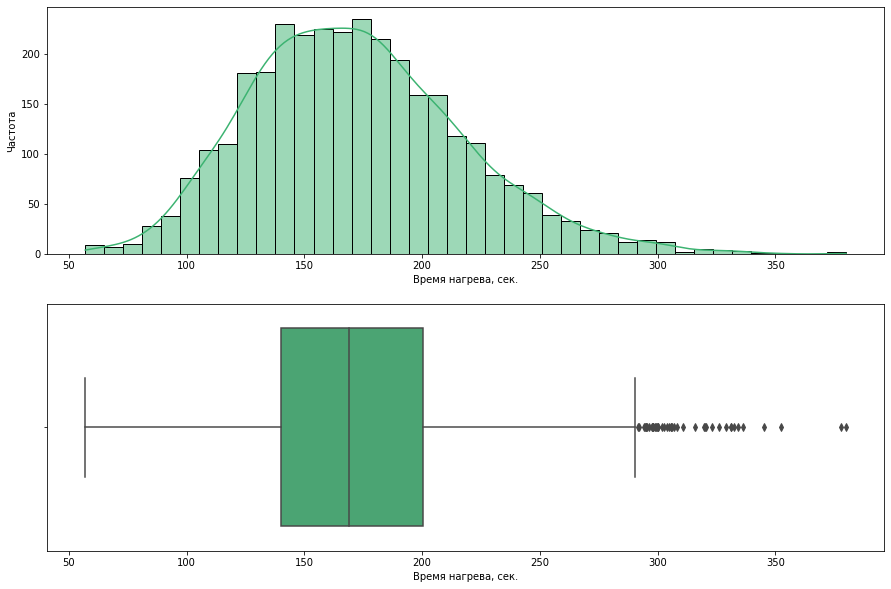

In [14]:
fig, axs = plt.subplots(2, 1, figsize=(15, 10))

sns.histplot(agg_data_arc_heat_time, color='mediumseagreen', kde=True, ax=axs[0])
sns.boxplot(x=agg_data_arc_heat_time, color='mediumseagreen', ax=axs[1])

axs[0].set_xlabel('Время нагрева, сек.')
axs[0].set_ylabel('Частота')

axs[1].set_xlabel('Время нагрева, сек.')

plt.show()

Как мы видим из представленных графиков, распределение времени нагрева близко к нормальному, медиана и среднее имеют различие в 3.5 секунды, а значения более 280 можно считать выбросами.

Рассмотрим количество стадий нагрева для каждой партии.

In [18]:
agg_data_arc_heat_count = data_arc_new.groupby('key')['heat_time_sec'].count()
agg_data_arc_heat_count.info()

In [19]:
agg_data_arc_heat_count.describe()

count    3214.000000
mean        4.628500
std         1.608647
min         1.000000
25%         4.000000
50%         4.000000
75%         6.000000
max        16.000000
Name: heat_time_sec, dtype: float64

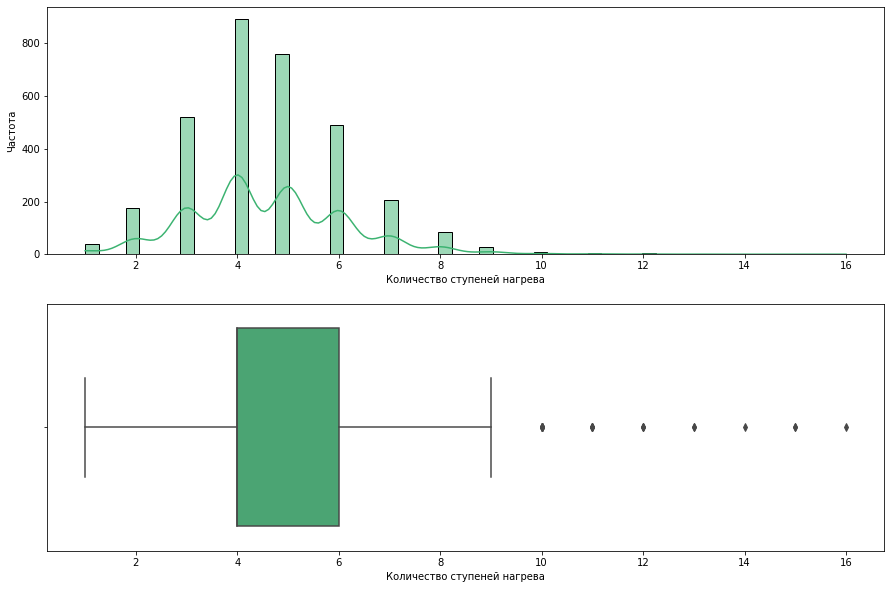

In [20]:
fig, axs = plt.subplots(2, 1, figsize=(15, 10))

sns.histplot(agg_data_arc_heat_count,  color='mediumseagreen', kde=True, ax=axs[0])
sns.boxplot(x=agg_data_arc_heat_count, color='mediumseagreen', ax=axs[1])

axs[0].set_xlabel('Количество ступеней нагрева')
axs[0].set_ylabel('Частота')

axs[1].set_xlabel('Количество ступеней нагрева')

plt.show()

Как видно из приведенной информации и графиков, чаще всего партии нагревают 4 раза, но в целом значения колеблются от 1 до 16. Медианное значение совпадает с 1-м квартилем в значении 4, 3 квартиль находится в значении 6. Есть небольшое количество выбросов в интервале от 10 до 16.

##### Предобработка данных

Проверим датасет на наличие пропусков и дубликатов

In [21]:
data_arc_new.isna().sum()

key               0
start_time        0
end_time          0
power_active      0
power_reactive    0
heat_time_sec     0
dtype: int64

In [22]:
data_arc_new.duplicated().sum()

0

Как мы видим, дубликаты и пропуски отсутствуют.

Реактивная мощность, равная отрицательному значению - это аномальное значение, связанное с какой-либо ошибкой. Следовательно такое значение должно быть отброшено обязательно.
Все остальные значения, даже определенные как выбросы на диаграммах размаха - являются физичными, а следовательно останутся важными для обучения модели.

In [23]:
data_arc_new = data_arc_new[data_arc_new['power_reactive'] > 0]

##### Выводы по датасету 

По анализу данных о нагреве электродов можно сделать следующие выводы:
1. Имеется номер партии, и время начала и окончания нагрева, а так же активная мощность, затраченная на нагрев, и реактивная, потерянная из-за переменного тока;
2. В датасете присутствует описание 3241 партии стали, при этом в каждой партии количество нагревов различается;
3. Распределение значений активной мощности не выглядит аномальным, в отличие от реактивной мощности, где присутствует выброс со значением -715, что в сотни раз отличается от остальных значений. Данное значение не физично, а поэтому будет удалено;
4. Распределение времени нагрева близко к нормальному, медиана и среднее имеют различие в 3.5 секунды, а значения более 280 можно считать выбросами;
5. Чаще всего партии нагревают 4 раза, но в целом значения колеблются от 1 до 16. Медианное значение совпадает с 1-м квартилем в значении 4, 3 квартиль находится в значении 6.

Это позволяет дать следующие рекомендации по подготвке данных значений для последующего обучения:
1. Рассчитать медианную мощность нагрева для каждой партии, при этом объединить активную и реактивную мощность.


#### Данные о подаче сыпучих материалов (объём)

In [24]:
data_bulk_new.head(10)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


In [25]:
data_bulk_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


In [26]:
data_bulk_new.describe()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


В данном датасете присутствует информация об объеме добавленных сыпучих легирующих материалах. Для каждой партии присутствует информация об объеме добавленных добавок 15 различных типов. Для каждой партии используются различные комбинации сыпучих добавок. При этом не для всех партий имеется информация о добавлении каких-либо сыпучих добавок.

In [27]:
data_bulk_new_describe = data_bulk_new.drop('key', axis=1).describe().transpose()
data_bulk_new_describe.sort_values(by='count', ascending=False)

,count,mean,std,min,25%,50%,75%,max
Bulk 14,2806.0,170.284747,65.868652,16.0,119.00,151.0,205.75,636.0
Bulk 12,2450.0,260.471020,120.649269,53.0,204.00,208.0,316.00,1849.0
Bulk 15,2248.0,160.513345,51.765319,1.0,105.00,160.0,205.00,405.0
Bulk 3,1298.0,113.879045,75.483494,6.0,58.00,97.5,152.00,454.0
Bulk 4,1014.0,104.394477,48.184126,12.0,72.00,102.0,133.00,281.0
Bulk 6,576.0,118.925347,72.057776,17.0,69.75,100.0,157.00,503.0
Bulk 1,252.0,39.242063,18.277654,10.0,27.00,31.0,46.00,185.0
Bulk 11,177.0,76.819209,59.655365,8.0,25.00,64.0,106.00,313.0
Bulk 10,176.0,83.284091,26.060347,24.0,64.00,86.5,102.00,159.0
Bulk 5,77.0,107.025974,81.790646,11.0,70.00,86.0,132.00,603.0


Из таблицы видно, что частота использования каждой добавки различается: присутствует добавка, использовавшаяся только в одной партии, а так же добавки, использующиеся в 2800 партиях. При этом объем использованных добавок так же различается. Можно предположить, что добавки, используещиеся реже, в среднеи добавлятся в сплав в большем объеме, чем те, что используются часто.

Объединим присадки, использующиеся менее 100 раз в одну группу для упрощения анализа.

In [28]:
data_bulk_new.describe()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


In [29]:
def agg_rare_adds(data, new_column):
    new_data = data.copy()
    rare_columns = []
    
    for column in data.drop('key', axis=1).columns:
        if data[column].count() < 50:
            rare_columns.append(column)
    
    if len(rare_columns) > 0:
        new_data[new_column] = data[rare_columns].sum(axis=1)
        new_data.drop(rare_columns, axis=1, inplace=True)
    
    return new_data

data_bulk_new = agg_rare_adds(data_bulk_new, 'other_bulks')
data_bulk_new.head(10)

,key,Bulk 1,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 10,Bulk 11,Bulk 12,Bulk 14,Bulk 15,other_bulks
0,1,NaN,NaN,43.0,NaN,NaN,NaN,NaN,206.0,150.0,154.0,0.0
1,2,NaN,NaN,73.0,NaN,NaN,NaN,NaN,206.0,149.0,154.0,0.0
2,3,NaN,NaN,34.0,NaN,NaN,NaN,NaN,205.0,152.0,153.0,0.0
3,4,NaN,NaN,81.0,NaN,NaN,NaN,NaN,207.0,153.0,154.0,0.0
4,5,NaN,NaN,78.0,NaN,NaN,NaN,NaN,203.0,151.0,152.0,0.0
5,6,NaN,NaN,117.0,NaN,NaN,NaN,NaN,204.0,201.0,154.0,0.0
6,7,NaN,NaN,117.0,NaN,NaN,NaN,NaN,204.0,152.0,154.0,0.0
7,8,NaN,NaN,99.0,NaN,NaN,NaN,NaN,410.0,252.0,153.0,0.0
8,9,NaN,NaN,117.0,NaN,NaN,NaN,NaN,107.0,99.0,203.0,0.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,102.0,204.0,0.0


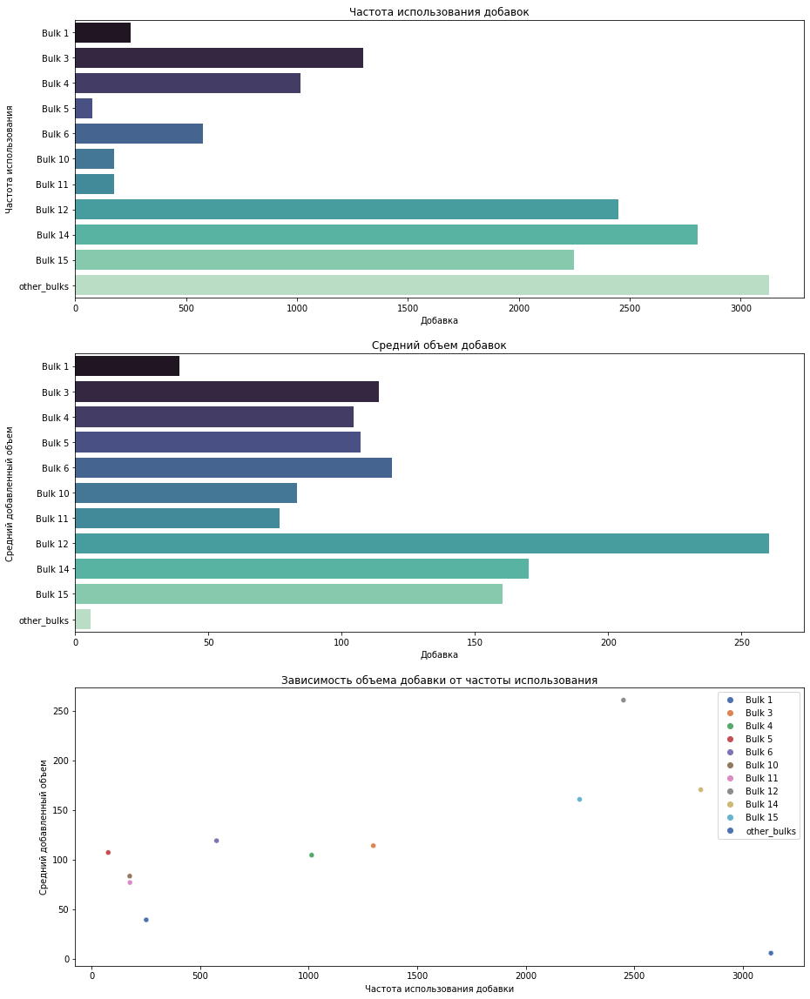

In [30]:
data_bulk_new_describe = data_bulk_new.drop('key', axis=1).describe().transpose()
data_bulk_new_describe.sort_values(by='count', ascending=False)

fig, axs = plt.subplots(3, 1, figsize=(15, 20))

sns.barplot(
    data=data_bulk_new_describe,
    x='count',
    y=data_bulk_new_describe.index, 
    palette='mako',
    orient='h',
    ax=axs[0]
)

axs[0].set_xlabel('Добавка')
axs[0].set_ylabel('Частота использования')
axs[0].set_title('Частота использования добавок')

sns.barplot(
    data=data_bulk_new_describe,
    x='mean',
    y=data_bulk_new_describe.index, 
    palette='mako',
    orient='h',
    ax=axs[1]
)

axs[1].set_xlabel('Добавка')
axs[1].set_ylabel('Средний добавленный объем')
axs[1].set_title('Средний объем добавок')

sns.scatterplot(
    data=data_bulk_new_describe,
    x='count',
    y='mean',
    hue=data_bulk_new_describe.index,
    palette='deep',
    ax=axs[2]
)

axs[2].set_xlabel('Частота использования добавки')
axs[2].set_ylabel('Средний добавленный объем')
axs[2].set_title('Зависимость объема добавки от частоты использования')

plt.show()

Из графиков видно, что никакой четкой корреляции между объемом добавки и частотой ее использования нет.

##### Предобработка данных

Проверим количество дубликатов в датасете. Проверку на пропуски опустим, поскольку пропусками указано отсуствие присадок в ковше.

In [31]:
data_bulk_new.duplicated().sum()

0

Дубликаты отсутствуют.

Объединим все присадки, использующиеся менее, чем в 100 ковшах, в одну группу.

In [32]:
def agg_rare_adds(data, new_column):
    new_data = data.copy()
    rare_columns = []
    
    for column in data.drop('key', axis=1).columns:
        if data[column].count() < 100:
            rare_columns.append(column)
    
    if len(rare_columns) > 0:
        new_data[new_column] = data[rare_columns].sum(axis=1)
        new_data.drop(rare_columns, axis=1, inplace=True)
    
    return new_data

data_bulk_new = agg_rare_adds(data_bulk_new, 'other_bulks')
data_bulk_new.head(10)

,key,Bulk 1,Bulk 3,Bulk 4,Bulk 6,Bulk 10,Bulk 11,Bulk 12,Bulk 14,Bulk 15,other_bulks
0,1,NaN,NaN,43.0,NaN,NaN,NaN,206.0,150.0,154.0,0.0
1,2,NaN,NaN,73.0,NaN,NaN,NaN,206.0,149.0,154.0,0.0
2,3,NaN,NaN,34.0,NaN,NaN,NaN,205.0,152.0,153.0,0.0
3,4,NaN,NaN,81.0,NaN,NaN,NaN,207.0,153.0,154.0,0.0
4,5,NaN,NaN,78.0,NaN,NaN,NaN,203.0,151.0,152.0,0.0
5,6,NaN,NaN,117.0,NaN,NaN,NaN,204.0,201.0,154.0,0.0
6,7,NaN,NaN,117.0,NaN,NaN,NaN,204.0,152.0,154.0,0.0
7,8,NaN,NaN,99.0,NaN,NaN,NaN,410.0,252.0,153.0,0.0
8,9,NaN,NaN,117.0,NaN,NaN,NaN,107.0,99.0,203.0,0.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,203.0,102.0,204.0,0.0


Поскольку большое количество пропусков связано с тем, что каждому ковшу добавляют различные присадки.
Поэтому, удалять их ни в кроем случае нельзя. Заменим все пропуски нулевыми значениями.

In [33]:
data_bulk_new.fillna(value=0, inplace=True)

##### Выводы по датасету 

Можно сделать вывод, что данный датасет не несет никакой скрытой информации, но его можно использовать для понимания состава итогового сплава на выходе, особенно при добавлении информации легирующих добавках в виде проволоки.
Четкой корреляции между объемом добавок и частотой использования нет, при этом данные очень сильно различаются для всех добавок. 

#### Данные о подаче сыпучих материалов (время)

In [34]:
data_bulk_time_new.head(10)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:28:48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:24:31,NaN,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaN,NaN,NaN,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:53:30,NaN,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaN,NaN,NaN,2019-05-03 12:32:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:27:13,NaN,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaN,NaN,NaN,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:58:00,NaN,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,2019-05-03 13:34:12,2019-05-03 13:30:47
5,6,NaN,NaN,NaN,2019-05-03 13:57:27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:48:52,NaN,2019-05-03 14:09:42,2019-05-03 14:03:15
6,7,NaN,NaN,NaN,2019-05-03 14:18:58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:41:26,NaN,2019-05-03 14:30:50,2019-05-03 14:27:16
7,8,NaN,NaN,NaN,2019-05-03 15:17:58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 15:17:58,NaN,2019-05-03 15:13:18,2019-05-03 15:05:33
8,9,NaN,NaN,NaN,2019-05-03 16:03:08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 16:03:08,NaN,2019-05-03 16:00:16,2019-05-03 15:52:39
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 16:38:11,NaN,2019-05-03 16:34:24,2019-05-03 16:29:56


In [35]:
data_bulk_time_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


##### Вывод по датасету

В данном датасете находится история добавления сыпучих добавок в каждую партию.
Отдельно проанализировать данный датасет не представляется возможным, но его можно использовать совместно с датасетом о нагреве электродов, если совместить по времени, а так же с данными об объеме добавленных сыпучих материалов.

#### Данные о продувке сплава газом

In [36]:
data_gas_new.head(10)

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
5,6,11.273392
6,7,9.836267
7,8,15.171553
8,9,8.216623
9,10,6.529891


In [37]:
data_gas_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


In [38]:
data_gas_new.columns = ['key', 'gas_volume']

В этом датасете есть информация об объеме газа, затраченного на продувку сплава. Поскольку газ продувается несколько раз, а в данной таблице предоставлено одно значение для каждой партии, можно сделать вывод о том, что данные представленны суммарно.

In [39]:
data_gas_new.describe()

,key,gas_volume
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


Нельзя не отметить разницу между количеством партий в датасете и максимальным номером партии (3239 и 3241 соответственно). Данная таблица требует подробного изучения - возможно некоторые из партий были отбракована (стоит отметить о наличии чрезмерно низкого аномального значения реактивной мощности из первого датасета - возможно они связаны).

##### Выводы по датасету.

В данном датасете представлены данные об объеме поданного инертного газа. В связи с наличием лишь одной цифры, можно сделать вывод о том, что дана информация о суммарном поданном газе. Кроме того присутсвует различие между количеством партий и максимальным номером партии.

#### Результаты измерения температуры

In [40]:
data_temp_new.head(10)

,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0
5,1,2019-05-03 11:30:38,1613.0
6,2,2019-05-03 11:34:04,1581.0
7,2,2019-05-03 11:38:40,1577.0
8,2,2019-05-03 11:46:09,1589.0
9,2,2019-05-03 11:49:38,1604.0


In [41]:
data_temp_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           18092 non-null  int64  
 1   Время замера  18092 non-null  object 
 2   Температура   14665 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 424.2+ KB


In [42]:
data_temp_new.columns = ['key', 'time', 'temp']

В данном датасете присутствует номер партии, время замера и значение температуры. Как видно из датасета, для каждой партии присутствует несколько замеров температуры.

In [43]:
data_temp_new.describe()

,key,temp
count,18092.000000,14665.000000
mean,1616.460977,1590.722741
std,934.641385,20.394381
min,1.000000,1191.000000
25%,807.750000,1580.000000
50%,1618.000000,1590.000000
75%,2429.000000,1599.000000
max,3241.000000,1705.000000


Стоит отметить, что не для всех партий присутствуют замеры, и количество замеров сильно меньше. Из этого следует, что в данном датасете отсутствует температура для 1/6 партий.

Рассмотрим распределение значений температуры во всех замерах.

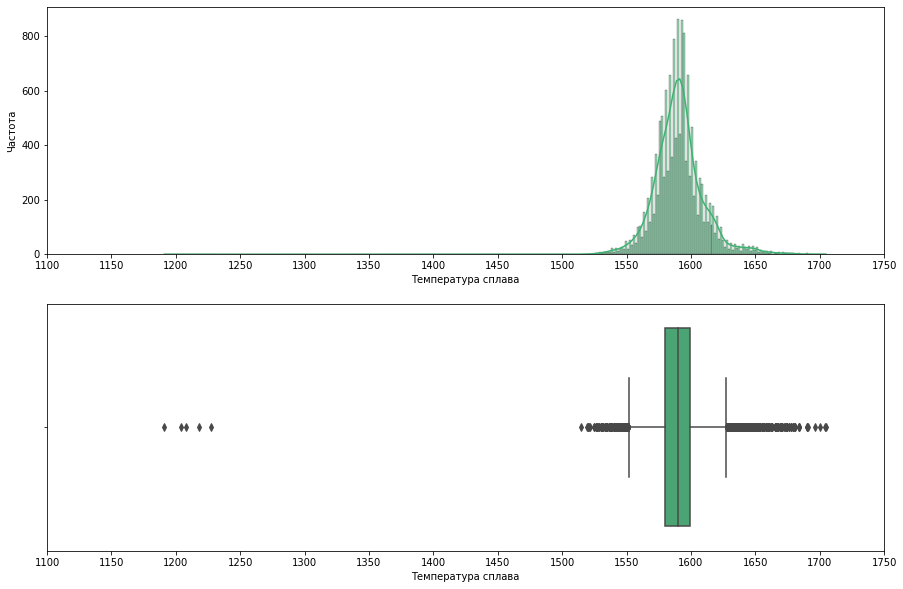

In [44]:
fig, axs = plt.subplots(2, 1, figsize=(15, 10))

sns.histplot(x=data_temp_new['temp'], color='mediumseagreen', kde=True, ax=axs[0])
sns.boxplot(x=data_temp_new['temp'], color='mediumseagreen', ax=axs[1])

axs[0].set_xlabel('Температура сплава')
axs[0].set_ylabel('Частота')
axs[0].set_xticks(range(1100,1800,50))

axs[1].set_xlabel('Температура сплава')
axs[1].set_xticks(range(1100,1800,50))


plt.show()

Как мы видим, большинство результатов замеров сосредоточено в диапазоне 1575-1600. Медианное значение практически совпадает со средним и равно 1590. Присутствует несколько аномально низких значений в области 1175-1250, а так же большое количество выбросов ближе к наблюдаемым минимуму и максимуму.
Температура плавления стали находится в интервале 1450—1520 °C, следовательно все значения меньше нижней границы этого интервала являются явными выбросами, которые необходимо удалить.

In [45]:
data_temp_new[data_temp_new['temp'].isna()]['key'].unique()

array([2500, 2501, 2502, 2503, 2504, 2505, 2506, 2507, 2508, 2509, 2510,
       2511, 2512, 2513, 2514, 2515, 2516, 2517, 2518, 2519, 2520, 2521,
       2522, 2523, 2524, 2525, 2526, 2527, 2528, 2529, 2530, 2531, 2532,
       2533, 2534, 2535, 2536, 2537, 2538, 2539, 2540, 2541, 2542, 2543,
       2544, 2545, 2546, 2547, 2548, 2549, 2550, 2551, 2552, 2553, 2554,
       2555, 2556, 2557, 2558, 2559, 2560, 2561, 2562, 2563, 2564, 2565,
       2566, 2567, 2568, 2569, 2570, 2571, 2572, 2573, 2574, 2575, 2576,
       2577, 2578, 2579, 2580, 2581, 2582, 2583, 2584, 2585, 2586, 2587,
       2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598,
       2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609,
       2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620,
       2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631,
       2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642,
       2643, 2644, 2645, 2646, 2647, 2648, 2649, 26

Как мы видим, результаты замеров отсутствуют у последних партий. Из этого можно сделать вывод, что эти температуру этих партий необходимо предсказать. 

##### Предобработка данных

Как уже говорилось выше, в датасете присутствуют значения, которые меньше интервала температуры плавления стали.
Поскольку такие значения не физичны для процесса сталеварения, удалим партии с подобными строками.

In [46]:
keys_to_drop = data_temp_new[data_temp_new['temp'] < 1450]['key'].unique()

data_temp_new = data_temp_new[~data_temp_new['key'].isin(keys_to_drop)]

##### Выводы по датасету 

В данном датасете присутствует номер партии, время замера и значение температуры. Как видно из датасета, для каждой партии присутствует несколько замеров температуры. Большинство результатов замеров сосредоточено в диапазоне 1575-1600. Медианное значение практически совпадает со средним и равно 1590. Присутствует несколько аномально низких значений в области 1175-1250, которые не являются физичными, а так же большое количество выбросов ближе к наблюдаемым минимуму и максимуму. Результаты замеров отсутствуют у последних партий.

#### Данные о проволочных материалах (объём)

In [47]:
data_wire_new.head(10)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
data_wire_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


In [49]:
data_wire_new.describe()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442841,15.132,48.016974,10.039007,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,2434.000000,126.060483,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


В данном датасете, как и в случае с сыпучими материалами, назодятся данные о добавлении легирующих добавок в виде проволоки. По составу и количеству пропусков для каждой партии датасет практически идентичен указанному датасету.
В связи с этим, рассмотрим его тем же путем.

In [50]:
data_wire_new_describe = data_wire_new.drop('key', axis=1).describe().transpose()
data_wire_new_describe

,count,mean,std,min,25%,50%,75%,max
Wire 1,3055.0,100.895853,42.012518,1.918800,72.115684,100.158234,126.060483,330.314424
Wire 2,1079.0,50.577323,39.320216,0.030160,20.193680,40.142956,70.227558,282.780152
Wire 3,63.0,189.482681,99.513444,0.144144,95.135044,235.194977,276.252014,385.008668
Wire 4,14.0,57.442841,28.824667,24.148801,40.807002,45.234282,76.124619,113.231044
Wire 5,1.0,15.132000,NaN,15.132000,15.132000,15.132000,15.132000,15.132000
Wire 6,73.0,48.016974,33.919845,0.034320,25.053600,42.076324,64.212723,180.454575
Wire 7,11.0,10.039007,8.610584,0.234208,6.762756,9.017009,11.886057,32.847674
Wire 8,19.0,53.625193,16.881728,45.076721,46.094879,46.279999,48.089603,102.762401
Wire 9,29.0,34.155752,19.931616,4.622800,22.058401,30.066399,43.862003,90.053604


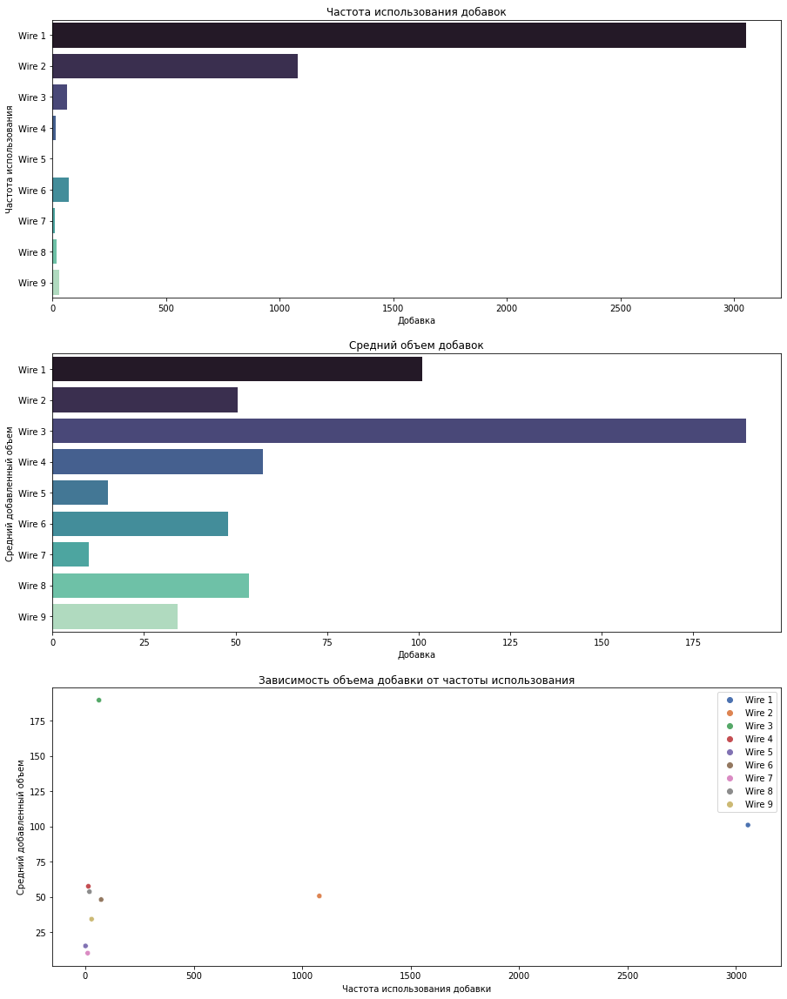

In [51]:
fig, axs = plt.subplots(3, 1, figsize=(15, 20))

sns.barplot(
    data=data_wire_new_describe,
    x='count',
    y=data_wire_new_describe.index, 
    palette='mako',
    orient='h',
    ax=axs[0]
)

axs[0].set_xlabel('Добавка')
axs[0].set_ylabel('Частота использования')
axs[0].set_title('Частота использования добавок')

sns.barplot(
    data=data_wire_new_describe,
    x='mean',
    y=data_wire_new_describe.index, 
    palette='mako',
    orient='h',
    ax=axs[1]
)

axs[1].set_xlabel('Добавка')
axs[1].set_ylabel('Средний добавленный объем')
axs[1].set_title('Средний объем добавок')

sns.scatterplot(
    data=data_wire_new_describe,
    x='count',
    y='mean',
    hue=data_wire_new_describe.index,
    palette='deep',
    ax=axs[2]
)

axs[2].set_xlabel('Частота использования добавки')
axs[2].set_ylabel('Средний добавленный объем')
axs[2].set_title('Зависимость объема добавки от частоты использования')

plt.show()

Из приведенных графиков видно, что две первых добавки используют гораздо чаще других, при этом средний добавленный объем равен половине от максимально добавленного. Кроме того, можно отметить, что средний объем добавки не коррелирует с частотой ее использования.

##### Предобработка данных

In [52]:
data_wire_new = agg_rare_adds(data_wire_new, 'other_wires')
data_wire_new.fillna(value=0, inplace=True)

##### Выводы по датасету

Как и в случае с сыпучими легирующими добавками, можно сделать вывод, что данный датасет не несет никакой скрытой информации, но его можно использовать для понимания состава итогового сплава на выходе, особенно при добавлении информации легирующих добавках в виде проволоки.
Четкой корреляции между объемом добавок и частотой использования нет, при этом данные очень сильно различаются для всех добавок. 

#### Данные о проволочных материалах (время)

In [53]:
data_wire_time_new.head(10)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:11:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,2019-05-03 13:57:27,2019-05-03 13:48:52,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,2019-05-03 14:18:58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,2019-05-03 15:01:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,2019-05-03 15:45:44,2019-05-03 15:39:37,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,2019-05-03 16:27:00,2019-05-03 16:22:36,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
data_wire_time_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


В данном датасете так же представлено время добавления легирующей добавки в каждую партию.

In [55]:
data_wire_time_new.describe()

,key
count,3081.000000
mean,1623.426485
std,932.996726
min,1.000000
25%,823.000000
50%,1619.000000
75%,2434.000000
max,3241.000000


Из таблицы видно, что количество имеющихся партий не сопадает с их максимальным количеством. Возможно это связано с тем, что не во все партии требовалось добавить материалы из проволоки.

##### Выводы по датасету

В данном датасете представлены данные о времени, когда была добавлена какая-либо легирующая добавка в виде проволоки. Количество имеющихся в таблице партий меньше максимального номера партии, что может свидетельствовать о том, что не во все партии добавляются добавки в виде проволоки.

#### Совместный анализ датасетов.

Рассмотрим связь между датасетами. Для начала, объединим данные о включении электродов и добавлении легирующих материалов, поскольку нагрве происходить перед их добавлением.

In [56]:
data_new = data_arc_new.merge(data_bulk_time_new, on='key', how='left').merge(data_wire_time_new, on='key', how='inner')

In [57]:
data_key_1 = data_new[data_new['key']==1].dropna(axis=1)
data_key_1.head(10)

,key,start_time,end_time,power_active,power_reactive,heat_time_sec,Bulk 4,Bulk 12,Bulk 14,Bulk 15,Wire 1
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,185.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460,172.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979,365.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691,148.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19


На примере первой партии, можно увидеть, что на всех этапах добавляются одни и те же добавки. Нагрев заканчивается примерно за 10-15 секунд до добавления легирующего материала.

Добавим к данной таблице замеры температур.

In [58]:
data_key_1 = data_key_1.merge(data_temp_new, on='key', how='inner')
data_key_1

,key,start_time,end_time,power_active,power_reactive,heat_time_sec,Bulk 4,Bulk 12,Bulk 14,Bulk 15,Wire 1,time,temp
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:25:59,1606.0
5,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:30:38,1613.0
6,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,185.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:02:04,1571.0
7,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,185.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:07:18,1604.0
8,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,185.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:11:34,1618.0
9,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,185.0,2019-05-03 11:28:48,2019-05-03 11:24:31,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:06:19,2019-05-03 11:18:04,1601.0


In [59]:
data_key_1.shape

(30, 13)

Из этой таблицы можно сделать вывод о самом технологическом процессе:
1. Замер температуры
2. Нагрев сплава
2. Добавление легирующего материала
3. Замер температуры

### Выводы

По итогу исследовательского анализа данных можно сделать следующие выводы:
- Имеется номер партии, и время начала и окончания нагрева, а так же активная мощность, затраченная на нагрев, и реактивная, потерянная из-за переменного тока;
- В датасете присутствует описание 3241 партии стали, при этом в каждой партии количество нагревов различается;
- Распределение значений активной мощности не выглядит аномальным, в отличие от реактивной мощности, где присутствует выброс со значением -715, что в сотни раз отличается от остальных значений;
- Распределение времени нагрева близко к нормальному, медиана и среднее имеют различие в 3.5 секунды, а значения более 280 можно считать выбросами;
- Чаще всего партии нагревают 4 раза, но в целом значения колеблются от 1 до 16. Медианное значение совпадает с 1-м квартилем в значении 4, 3 квартиль находится в значении 6;
- Датасеты с количеством добавленных сыпучих и проволочных материалов можно использовать для понимания состава итогового сплава на выходе;
- Из датасета с историей замеров температуры видно, что для каждой партии присутствует несколько замеров температуры. Большинство результатов замеров сосредоточено в диапазоне 1575-1600. Медианное значение практически совпадает со средним и равно 1590. Присутствует несколько аномально низких значений в области 1175-1250, а так же большое количество выбросов ближе к наблюдаемым минимуму и максимуму. Результаты замеров отсутствуют у последних партий;


<div class="alert alert-success" style="border-color: green; border-radius: 5px">
    <p><u><b>✅ КОММЕНТАРИЙ МЕНТОРА 2</b></u></p>
Доброго дня, Дмитрий!<br>
ОК, понял.<br>
Впереди, тогда, только успешное моделирование)<br>
УСПЕХОВ! Если возникнут вопросы - в слаке сможем пересечься.

## Подготовка датасета для моделей машинного обучения

В качестве исходных данных имеется следующая информация:
- `data_arc_new.csv` — данные об электродах;
- `data_bulk_new.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time_new.csv` — данные о подаче сыпучих материалов (время);
- `data_gas_new.csv` — данные о продувке сплава газом;
- `data_temp_new.csv` — результаты измерения температуры;
- `data_wire_new.csv` — данные о проволочных материалах (объём);
- `data_wire_time_new.csv` — данные о проволочных материалах (время).

Во всех файлах столбец key содержит номер партии. В случае нескольких строк с одинаковым значением key - они соответствуют разным итерациям обработки.

Объектом моделирования в данном проекте является ковш и его финальная температура. Таким образом, все промежуточные параметры не являются релевантными и могут быть использованы только в опосредованном виде, в случае, если их предсказание не является отдельной задачей машинного обучения.

Для создания датасета, который будет использоваться для обучения модели и последующего прогноза, воспользуемся следующим подходом: сначала добавим номер ковша и значение начального и конечного замера температуры, а затем к этому датасету будем добавлять информацию из остальных датасетов, если она релевантна.

В конечном датасете будут только те ковши, для которых информация присутствует в каждом датасете.

Для начала, отберем только те партии, в которых есть финальный замер температуры. Для этого посчитаем количество замеров для каждого ковша и количество включений электродов.
В дальнейшем будут использованы только те ковши, в которых количество замеров больше количества включений электродов.

In [60]:
arc_count = data_arc_new.groupby('key').count()['power_active']
temp_count = data_temp_new.groupby('key').count()['temp']

temp_vs_arc = pd.concat([temp_count, arc_count], axis=1).reset_index()
keys = temp_vs_arc[temp_vs_arc['temp'] > temp_vs_arc['power_active']]['key']

Создадим изначальный датасет, к которому мы будем добавлять информацию в дальнейшем. Изначально в нем будет номер ковша и начальная и конечная температура.

In [61]:
data = data_temp_new[data_temp_new['key'].isin(keys)].sort_values(
    by=['key', 'time']
).groupby('key').agg({'temp':['first', 'last']}).reset_index()

data.columns = ['key', 'initial_temp', 'final_temp']
data.head(10)

,key,initial_temp,final_temp
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
4,5,1576.0,1602.0
5,6,1543.0,1596.0
6,7,1586.0,1599.0
7,8,1577.0,1598.0
8,9,1587.0,1592.0
9,10,1574.0,1593.0


Теперь к данному датасету добавим информацию о мощности при нагреве. Чтобы учесть технологические особенности, рассчитаем полную мощность, квадрат которой равен сумме квадратов активной и реактивной мощностей.

In [63]:
def full_power(active_power, reactive_power):
    full_power = (active_power ** 2 + reactive_power ** 2) ** 0.5
    return full_power

data_arc_new['full_power'] = data_arc_new.apply(
    lambda row: full_power(row['power_active'], row['power_reactive']), axis=1
)

data = data.merge(
    data_arc_new.groupby('key')['full_power'].sum(),
    on='key',
    how='inner'
)

data.head(10)

,key,initial_temp,final_temp,full_power
0,1,1571.0,1613.0,3.718736
1,2,1581.0,1602.0,2.588349
2,3,1596.0,1599.0,5.019223
3,4,1601.0,1625.0,3.400038
4,5,1576.0,1602.0,2.816980
5,6,1543.0,1596.0,3.313074
6,7,1586.0,1599.0,3.283913
7,8,1577.0,1598.0,3.405956
8,9,1587.0,1592.0,4.335261
9,10,1574.0,1593.0,3.791005


Теперь добавим к датасету остальную информацию.

In [64]:
data = data.merge(data_bulk_new, on='key', how='inner')
data.head(10)

,key,initial_temp,final_temp,full_power,Bulk 1,Bulk 3,Bulk 4,Bulk 6,Bulk 10,Bulk 11,Bulk 12,Bulk 14,Bulk 15,other_bulks
0,1,1571.0,1613.0,3.718736,0.0,0.0,43.0,0.0,0.0,0.0,206.0,150.0,154.0,0.0
1,2,1581.0,1602.0,2.588349,0.0,0.0,73.0,0.0,0.0,0.0,206.0,149.0,154.0,0.0
2,3,1596.0,1599.0,5.019223,0.0,0.0,34.0,0.0,0.0,0.0,205.0,152.0,153.0,0.0
3,4,1601.0,1625.0,3.400038,0.0,0.0,81.0,0.0,0.0,0.0,207.0,153.0,154.0,0.0
4,5,1576.0,1602.0,2.816980,0.0,0.0,78.0,0.0,0.0,0.0,203.0,151.0,152.0,0.0
5,6,1543.0,1596.0,3.313074,0.0,0.0,117.0,0.0,0.0,0.0,204.0,201.0,154.0,0.0
6,7,1586.0,1599.0,3.283913,0.0,0.0,117.0,0.0,0.0,0.0,204.0,152.0,154.0,0.0
7,8,1577.0,1598.0,3.405956,0.0,0.0,99.0,0.0,0.0,0.0,410.0,252.0,153.0,0.0
8,9,1587.0,1592.0,4.335261,0.0,0.0,117.0,0.0,0.0,0.0,107.0,99.0,203.0,0.0
9,10,1574.0,1593.0,3.791005,0.0,0.0,0.0,0.0,0.0,0.0,203.0,102.0,204.0,0.0


In [65]:
data = data.merge(data_gas_new, on='key', how='inner')
data.head(10)

,key,initial_temp,final_temp,full_power,Bulk 1,Bulk 3,Bulk 4,Bulk 6,Bulk 10,Bulk 11,Bulk 12,Bulk 14,Bulk 15,other_bulks,gas_volume
0,1,1571.0,1613.0,3.718736,0.0,0.0,43.0,0.0,0.0,0.0,206.0,150.0,154.0,0.0,29.749986
1,2,1581.0,1602.0,2.588349,0.0,0.0,73.0,0.0,0.0,0.0,206.0,149.0,154.0,0.0,12.555561
2,3,1596.0,1599.0,5.019223,0.0,0.0,34.0,0.0,0.0,0.0,205.0,152.0,153.0,0.0,28.554793
3,4,1601.0,1625.0,3.400038,0.0,0.0,81.0,0.0,0.0,0.0,207.0,153.0,154.0,0.0,18.841219
4,5,1576.0,1602.0,2.816980,0.0,0.0,78.0,0.0,0.0,0.0,203.0,151.0,152.0,0.0,5.413692
5,6,1543.0,1596.0,3.313074,0.0,0.0,117.0,0.0,0.0,0.0,204.0,201.0,154.0,0.0,11.273392
6,7,1586.0,1599.0,3.283913,0.0,0.0,117.0,0.0,0.0,0.0,204.0,152.0,154.0,0.0,9.836267
7,8,1577.0,1598.0,3.405956,0.0,0.0,99.0,0.0,0.0,0.0,410.0,252.0,153.0,0.0,15.171553
8,9,1587.0,1592.0,4.335261,0.0,0.0,117.0,0.0,0.0,0.0,107.0,99.0,203.0,0.0,8.216623
9,10,1574.0,1593.0,3.791005,0.0,0.0,0.0,0.0,0.0,0.0,203.0,102.0,204.0,0.0,6.529891


In [66]:
data = data.merge(data_wire_new, on='key', how='inner')
data.head(10)

,key,initial_temp,final_temp,full_power,Bulk 1,Bulk 3,Bulk 4,Bulk 6,Bulk 10,Bulk 11,Bulk 12,Bulk 14,Bulk 15,other_bulks,gas_volume,Wire 1,Wire 2,other_wires
0,1,1571.0,1613.0,3.718736,0.0,0.0,43.0,0.0,0.0,0.0,206.0,150.0,154.0,0.0,29.749986,60.059998,0.000000,0.0
1,2,1581.0,1602.0,2.588349,0.0,0.0,73.0,0.0,0.0,0.0,206.0,149.0,154.0,0.0,12.555561,96.052315,0.000000,0.0
2,3,1596.0,1599.0,5.019223,0.0,0.0,34.0,0.0,0.0,0.0,205.0,152.0,153.0,0.0,28.554793,91.160157,0.000000,0.0
3,4,1601.0,1625.0,3.400038,0.0,0.0,81.0,0.0,0.0,0.0,207.0,153.0,154.0,0.0,18.841219,89.063515,0.000000,0.0
4,5,1576.0,1602.0,2.816980,0.0,0.0,78.0,0.0,0.0,0.0,203.0,151.0,152.0,0.0,5.413692,89.238236,9.114560,0.0
5,6,1543.0,1596.0,3.313074,0.0,0.0,117.0,0.0,0.0,0.0,204.0,201.0,154.0,0.0,11.273392,99.109917,9.114560,0.0
6,7,1586.0,1599.0,3.283913,0.0,0.0,117.0,0.0,0.0,0.0,204.0,152.0,154.0,0.0,9.836267,98.061600,0.000000,0.0
7,8,1577.0,1598.0,3.405956,0.0,0.0,99.0,0.0,0.0,0.0,410.0,252.0,153.0,0.0,15.171553,155.282394,0.000000,0.0
8,9,1587.0,1592.0,4.335261,0.0,0.0,117.0,0.0,0.0,0.0,107.0,99.0,203.0,0.0,8.216623,113.393279,9.143681,0.0
9,10,1574.0,1593.0,3.791005,0.0,0.0,0.0,0.0,0.0,0.0,203.0,102.0,204.0,0.0,6.529891,81.244796,12.376000,0.0


После добавления всех имеющихся свойств, удалим номер партии, поскольку данный параметр не влияет на технологический процесс.

In [67]:
data = data.drop('key', axis=1)

In [68]:
data.shape

(2325, 17)

Проверим полученную таблицу на мультиколлинеарность.

In [69]:
correlation_matrix = data.corr()
correlation_matrix

,initial_temp,final_temp,full_power,Bulk 1,Bulk 3,Bulk 4,Bulk 6,Bulk 10,Bulk 11,Bulk 12,Bulk 14,Bulk 15,other_bulks,gas_volume,Wire 1,Wire 2,other_wires
initial_temp,1.000000,0.301961,-0.152713,0.079137,-0.113271,0.165562,-0.127241,0.035824,-0.110397,-0.079339,-0.180058,-0.062137,0.078745,0.036730,0.262946,-0.101012,0.010252
final_temp,0.301961,1.000000,0.175284,-0.075233,-0.036767,0.188100,-0.181880,0.061345,-0.114777,0.267379,0.114520,0.266386,-0.028365,0.059036,0.317702,-0.206837,-0.091021
full_power,-0.152713,0.175284,1.000000,0.098169,0.100904,0.004955,0.132746,0.009707,0.065315,0.285904,0.298432,0.168755,0.073143,0.370381,0.138353,0.062533,0.078908
Bulk 1,0.079137,-0.075233,0.098169,1.000000,-0.011462,0.041733,-0.003822,-0.023304,-0.037985,0.325753,0.207525,-0.001041,0.060378,0.234081,0.013896,-0.009198,0.076749
Bulk 3,-0.113271,-0.036767,0.100904,-0.011462,1.000000,-0.295303,0.065696,-0.085192,-0.007331,0.018409,0.011061,-0.012791,-0.006734,0.059651,0.037950,0.095025,0.002054
Bulk 4,0.165562,0.188100,0.004955,0.041733,-0.295303,1.000000,-0.251889,-0.084900,-0.119670,0.105505,-0.091238,0.101169,0.028303,0.017521,0.298265,-0.267932,-0.036344
Bulk 6,-0.127241,-0.181880,0.132746,-0.003822,0.065696,-0.251889,1.000000,-0.097343,0.196636,-0.113197,0.177098,-0.109732,-0.021937,0.139475,-0.235764,0.204771,-0.054085
Bulk 10,0.035824,0.061345,0.009707,-0.023304,-0.085192,-0.084900,-0.097343,1.000000,-0.045646,0.027779,-0.045933,0.052078,-0.028531,-0.008637,0.062951,-0.103766,-0.035501
Bulk 11,-0.110397,-0.114777,0.065315,-0.037985,-0.007331,-0.119670,0.196636,-0.045646,1.000000,-0.040295,0.077916,-0.048434,-0.015879,0.041942,-0.117736,0.062112,-0.021724
Bulk 12,-0.079339,0.267379,0.285904,0.325753,0.018409,0.105505,-0.113197,0.027779,-0.040295,1.000000,0.481087,0.614182,-0.072855,0.216869,0.171090,-0.097866,-0.138494


In [70]:
threshold = 0.9

highly_correlated_pairs = (correlation_matrix
                           .unstack()  
                           .sort_values(ascending=False)
                           .reset_index()
                           .rename(columns={0: 'Correlation'})
                           .query(f'abs(Correlation) > {threshold} and abs(Correlation) != 1')
                          ) 

print(highly_correlated_pairs)

Empty DataFrame
Columns: [level_0, level_1, Correlation]
Index: []


Как мы видим коллинеарных признаков нет.

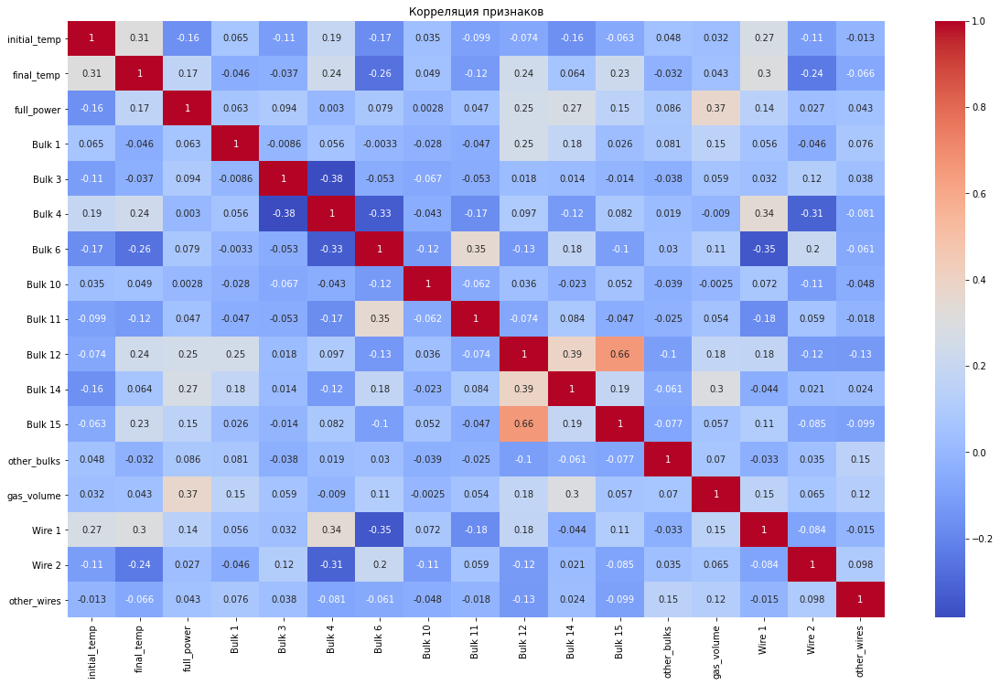

In [71]:
plt.figure(figsize=(20, 12))
plt.title('Корреляция признаков')
sns.heatmap(data.corr(method='spearman'), annot = True, cmap="coolwarm")
plt.show()

## Обучение моделей машинного обучения

Перед выбором моделей и их обучением, разобъем полученный датасет на выборки. Подбирать гиперпараметры и оценивать модели мы будем методом кросс-валидации, так что нам необходимо разбить датасет лишь на тренировочную и тестовую выборки в соотношении 25:75. 

In [72]:
features = data.drop('final_temp', axis=1)
target = data['final_temp']

features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.25, random_state=RANDOM_STATE
)

print(f'Размер тренировочной выборки: {features_train.shape}\nРазмер тестовой выборки: {features_test.shape}')

Размер тренировочной выборки: (1743, 16)
Размер тестовой выборки: (582, 16)


### Модель линейной регрессии

Для обучения модели линейной регрессии необходимо машстабировать признаки.

In [74]:
scaler = StandardScaler()

In [75]:
scaler.fit(features_train)
features_train_lin_reg = scaler.transform(features_train)
features_test_lin_reg = scaler.transform(features_test)

In [76]:
model_lin_reg = LinearRegression()

lin_reg_scores = cross_val_score(
    model_lin_reg, 
    features_train_lin_reg, 
    target_train, 
    scoring='neg_mean_absolute_error',
    verbose=2
)

lin_reg_scores.mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV] END .................................................... total time=   0.0s
[CV] END .................................................... total time=   0.0s
[CV] END .................................................... total time=   0.0s
[CV] END .................................................... total time=   0.0s
[CV] END .................................................... total time=   0.2s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s finished


-7.117564299976974

Модель линейной регресси дала результат МАЕ в 7.1, следовательно данная модель не подходит для наших целей.

### Модель случайного леса

In [79]:
model_rf = RandomForestRegressor(
    criterion='absolute_error',
    n_jobs=-1, 
    random_state=RANDOM_STATE
)

parameters_rf = {
    'n_estimators' : range(10,50,10),
    'max_depth' : [None] + [i for i in range(2, 7)],
    'min_samples_split' : range(2, 11, 5),
    'min_samples_leaf' : range(1,11,5),
    'max_features' : [1, 'sqrt', 'log2']
}

search_rf = RandomizedSearchCV(
    model_rf,
    parameters_rf,
    n_iter=50,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    verbose=1,
    random_state=RANDOM_STATE
)

search_rf.fit(features_train, target_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(estimator=RandomForestRegressor(n_jobs=-1,
                                                   random_state=161023),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [None, 2, 3, 4, 5, 6],
                                        'max_features': [1, 'sqrt', 'log2'],
                                        'min_samples_leaf': range(1, 11, 5),
                                        'min_samples_split': range(2, 11, 5),
                                        'n_estimators': range(10, 50, 10)},
                   random_state=161023, scoring='neg_mean_absolute_error',
                   verbose=1)

In [80]:
search_rf.best_score_

-7.126904576549146

Модель случайного леса дала результат, близкий к допустимому, но не достигла его, дав МАЕ, равную 7.1.

### Модель градиентного бустинга

In [81]:
model_catboost = CatBoostRegressor(loss_function='MAE', random_seed=RANDOM_STATE)

catboost_params = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.03, 0.1],
    'depth': [2, 4, 6, 8],
    'l2_leaf_reg': [0.2, 0.5, 1, 3]
}

model_catboost.randomized_search(
    catboost_params, 
    features_train, 
    target_train,
    partition_random_seed=RANDOM_STATE,
    search_by_train_test_split=False,
    cv=5,
    train_size=1.0,
    verbose=False,
    n_iter=100
)

Training on fold [0/5]
0:	learn: 1545.2257533	test: 1546.2958453	best: 1546.2958453 (0)	total: 47.2ms	remaining: 4.67s
1:	learn: 1498.8735014	test: 1499.9453069	best: 1499.9453069 (1)	total: 47.9ms	remaining: 2.35s
2:	learn: 1453.9421143	test: 1455.0061554	best: 1455.0061554 (2)	total: 48.5ms	remaining: 1.57s
3:	learn: 1410.3574486	test: 1411.4189982	best: 1411.4189982 (3)	total: 49.1ms	remaining: 1.18s
4:	learn: 1368.0651750	test: 1369.1259763	best: 1369.1259763 (4)	total: 49.6ms	remaining: 943ms
5:	learn: 1327.0389433	test: 1328.1005759	best: 1328.1005759 (5)	total: 50.2ms	remaining: 786ms
6:	learn: 1287.2552651	test: 1288.3186170	best: 1288.3186170 (6)	total: 50.7ms	remaining: 674ms
7:	learn: 1248.6561451	test: 1249.7175034	best: 1249.7175034 (7)	total: 51.3ms	remaining: 590ms
8:	learn: 1211.2205387	test: 1212.2827063	best: 1212.2827063 (8)	total: 51.8ms	remaining: 524ms
9:	learn: 1174.9159897	test: 1175.9713799	best: 1175.9713799 (9)	total: 52.4ms	remaining: 471ms
10:	learn: 1139.6

{'params': {'depth': 2,
  'iterations': 200,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.2},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [82]:
model_catboost.get_best_score()

{'learn': {'MAE': 6.316757474104626}}

Лучший результат по кросс-валидации показала модель градиентного бустинга CatBoost.
Проверим эту модель на тестовой выборке.

In [83]:
predictions = model_catboost.predict(features_test)
test_mae = mean_absolute_error(target_test, predictions)

print(test_mae)

6.502899265322136


Оценим влияние параметров на предсказания  с помощью библиотеки SHAP.

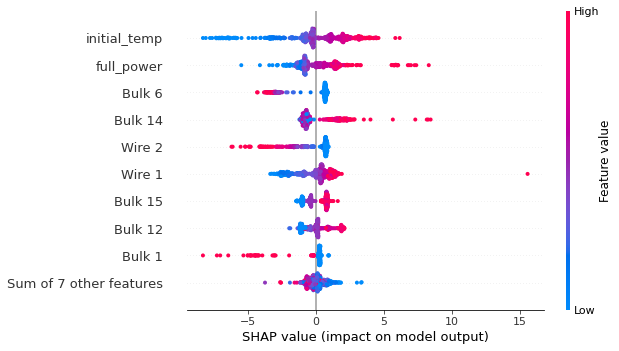

In [84]:
explainer = shap.TreeExplainer(model_catboost)
shap_values = explainer(features_test)

shap.plots.beeswarm(shap_values)

Как видно из графика, начальная температура имеет нибольшее влияние на итоговое значение, как и мощность, использованная за весь процесс для партии. Кроме того, в некоторых случаях добавление сыпуяей присадки №14 имеет так же большое влияние на конечную температуру. В целом, количество добавок не особо влияет на предсказание температуры. 

## Отчет о работе

Для достижения задач, поставленных в проекте, были выполнены все задачи, поставленные в плане работ:

1. **Анализ и предобработка исходных данных**
В рамках анализа была получена изначальная информация о структуре данных и сделан вывод об важности имеющихся параметров:
- все имеющиеся датасеты связаны с собой номером ковша/партии
- датасеты с объемом использованных добавок и газа дают представление о суммарном количенстве затраченных веществ, в то время как аналогичные датасеты с временной информацией дают информацию лишь о времени добавления, без количественной информации
- поступающая на эту стадию изначальная сталь имеет очень разный состав, либо требуется различный состав стали на выходе, поскольку количество добавок, их состав и количество стадий нагрева различается по всему датасету <br>
В рамках предобработки данных выолнены следующие действия:
- удалены партии, в которых присутствуют нефизичные и аномальные значения (температура ниже температуры плавления стали, реактивная мощность отрицательная)
- добавки, используемые реже 50 раз, объединены в одну группу для уменьшения количества признаков
- рассчитана полная суммарная мощность, затраченная на каждый ковш
- в датасет для последующего моделирования добавлены лишь те ковши, для которых есть информация на каждом этапе.

2. **Обучение моделей и их сравнение**
В итоговый датасет для обучения моделей были включены следующие параметры:
- полная суммарная мощность, затраченная на каждый ковш
- начальная и конечная температура ковша
- суммарные объемы газа, сыпучих и проволочных легирующих добавок для каждого ковша

Сравнение проводилось между тремя различными моделями: модель линейной регрессии, модель случайного леса и модель градиентного бустинга. Во всех трех случаях валидация модели проводилась методом кросс-валидации; для моделей случайного леса и градиентного бустинга проводился подбор гиперпараметров методом RandomizedSearchCV, позволяющий сократить время подбора оптимальных гиперпараметров.

По результатам сравнения, лучший результат показала моедль градиентного бустинга (CatBoost). По результатам кросс-валидации значение метрики МАЕ составило 6.3, что меньше порогового значения (6.8).
На тестовой выборке данная модель так же показала допустимое значение - 6.5.

2.1. **Описание модели**

В процессе выбора оптимальной модели изменялись следующие гиперпараметры:
- `depth` - глубина решающих деревьев, используемых в модели
- `iterations` - максимальное количество деревьев, которое может быть построено для решения задачи
- `learning_rate` - размер градиентного шага
- `l2_leaf_reg` - коэффициент регуляризации

По итогу исследования, лучшей моделью оказалась модель со следующими гиперпараметрами:
- `'loss_function': 'MAE'`
- `'random_seed': 161023`
- `'depth': 2`
- `'iterations': 200`
- `'learning_rate': 0.1`
- `'l2_leaf_reg': 0.2`

Все остальные параметры имели значения по умолчанию для данной библиотеки.

3. **Рекомендации по улучшению модели и решения**

Одной из рекомендаций по улучшению модели может быть уменьшение количества признаков на основании анализа важности факторов по числам Шепли. Кроме того, возможно стоит рассмотреть другие способы представления такого параметра как мощность - например, через значение работы (мощность * время). 
Еще одной возожной рекомендацией может быть регламентирование процессов по изменению состава сплава (при наличии такой технической возможности) или добавление в параметры параметров, описывающих исходный и финальный состав. Это может заменить историю добавок материалов, тем самым уменьшив количество признаков путем получения одного совокупного признака.
Дальнейшее улучшение модели так же может быть проведено в процессе донастройки гиперпараметров модели: в данном проекте были рассмотрены лишь некоторые параметры с небольшим разбросом значений.
Кроме того, можно изменить постановку задачи: в связи с тем: что разброс температуры будет всегда, надо уменьшить его.
Один из подходов такой: Наверняка есть границы, в пределах которых колебания температур - нормально.
В этом случае, если фикировать случаи, когда температура выходит за эти границы, и для таких моментов времени собирать инфо по производству:
что был за материал (химия материала), что был за газ (химический состав газа), какая бригада работала,
что  было с электродами. Тогда можно найти причины (через корреляции, проверки гипотез, разные модели), фиксировать эти причины и разрабатывать энергосберегательные мероприятия.